## Imports

In [43]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set(); sns.set_style('dark')
import time

## Functions

In [44]:
def rgb(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def bgr(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2BGR)

def gray(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

def disp(img, title='', s=12, vmin=None, vmax=None):
    plt.figure(figsize=(s,s))
    plt.axis('off')
    if vmin is not None and vmax is not None:
        plt.imshow(img, cmap='gray', vmin=vmin, vmax=vmax)
    else:
        plt.imshow(img, cmap='gray')
    plt.title(title)
    plt.show()

def uint8ify(img):
    img -= img.min()
    img /= img.max()
    img *= 255
    return np.uint8(img)

def overlay(a,b):
    # a and b should be float images and between 0-1

    mask = a >= 0.5 # generate boolean mask of everywhere a > 0.5 
    ab = np.zeros_like(a) # generate an output container for the blended image 

    # now do the blending 
    ab[~mask] = (2*a*b)[~mask] # 2ab everywhere a<0.5
    ab[mask] = (1-2*(1-a)*(1-b))[mask] # else this
    
    return ab

def before_after(img_a, img_b, name='', vmin=None, vmax=None, effect_name='Processed'):
    fig, axs = plt.subplots(1,2, constrained_layout=True, figsize=(10,4))
    axs[0].axis('off')
    axs[1].axis('off')
    axs[0].set_title(f'{name} Original')
    axs[1].set_title(f'{name} {effect_name}')
    if vmin is not None and vmax is not None:
        axs[0].imshow(img_a, cmap='gray', vmin=vmin, vmax=vmax)
        axs[1].imshow(img_b, cmap='gray', vmin=vmin, vmax=vmax)
    else:
        axs[0].imshow(img_a, cmap='gray')
        axs[1].imshow(img_b, cmap='gray')
    plt.show()

In [45]:
def rotate_image(img, alpha=0):

    # get the image dimensions
    h, w = img.shape[:2]

    # get the rotation matrix
    M = cv2.getRotationMatrix2D((w/2, h/2), alpha, 1)

    # rotate the image
    img_rot = cv2.warpAffine(img, M, (w, h))

    return img_rot

def rotate_image(img, alpha=0):

    # get the image dimensions
    h, w = img.shape[:2]

    # pad the image to avoid cropping
    pad = 550
    img_pad = cv2.copyMakeBorder(img, pad, pad, pad, pad, cv2.BORDER_CONSTANT, value=0)

    # get the rotation matrix
    M = cv2.getRotationMatrix2D((w/2+pad, h/2+pad), alpha, 1)

    # rotate the image
    img_rot = cv2.warpAffine(img_pad, M, (w+2*pad, h+2*pad))

    return img_rot
    
def rotate_image(img, alpha=0):
    # get the image dimensions
    h, w = img.shape[:2]

    # pad the image to avoid cropping
    theta_rad = np.deg2rad(alpha)
    pad_h = abs(int(abs(h*np.sin(theta_rad)) + abs(w*np.cos(theta_rad))) - w)
    pad_v = abs(int(abs(w*np.sin(theta_rad)) + abs(h*np.cos(theta_rad))) - h)

    img_pad = cv2.copyMakeBorder(img, pad_v//2, pad_v//2, pad_h//2, pad_h//2, cv2.BORDER_CONSTANT, value=0)

    # get the rotation matrix
    M = cv2.getRotationMatrix2D((w/2+pad_h/2, h/2+pad_v/2), alpha, 1)

    # rotate the image
    img_rot = cv2.warpAffine(img_pad, M, (w+pad_h, h+pad_v))

    return img_rot

## Load Images

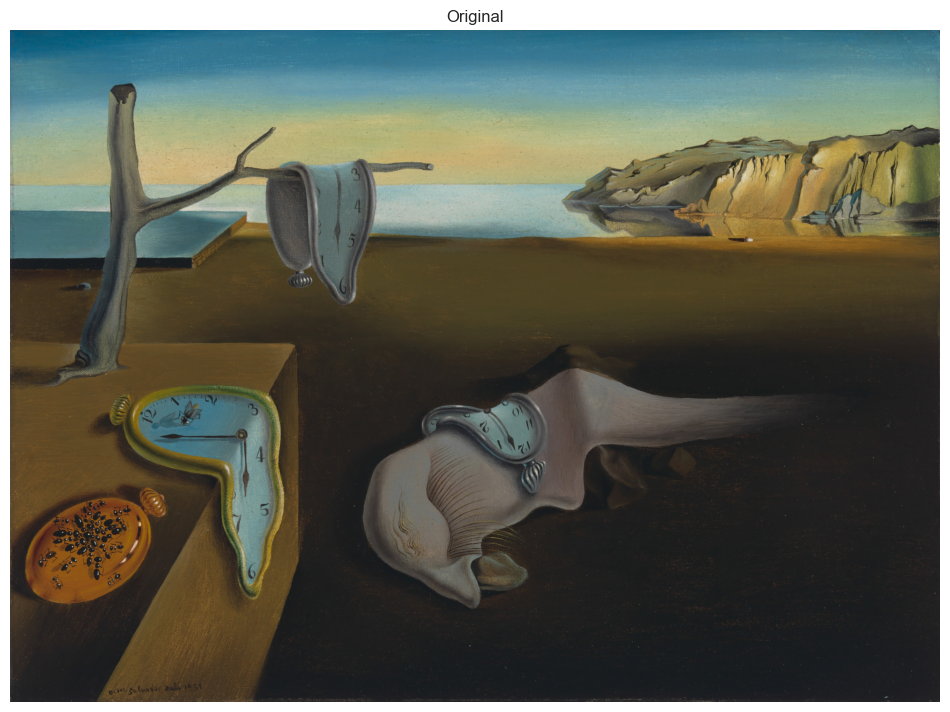

In [46]:
img = rgb(cv2.imread('dali.jpg'))
img_gray = gray(img)
disp(img, 'Original')

## FREAK

freak.detectAndCompute() is not implemented.

Extract keypoints using another method and detect using FREAK

In [47]:
def align_using_FREAK(img, angle, debug=True, extractor='SIFT', threshold=10):
    start_time = time.perf_counter()

    # convert to grayscale
    img_gray = gray(img)
    print(f'> {(time.perf_counter() - start_time)*1000:.2f} ms : Grayscale conversion')
    start_time = time.perf_counter()

    # rotate the image
    rotated_img = rotate_image(img, alpha=angle)
    print(f'> {(time.perf_counter() - start_time)*1000:.2f} ms : Rotation')
    start_time = time.perf_counter()

    # convert to grayscale
    rotated_img_gray = gray(rotated_img)
    print(f'> {(time.perf_counter() - start_time)*1000:.2f} ms : Grayscale conversion')
    start_time = time.perf_counter()

    # create a mask
    mask = np.ones_like(img_gray)

    # rotate the mask
    rotated_mask = rotate_image(mask, alpha=angle)
    print(f'> {(time.perf_counter() - start_time)*1000:.2f} ms : Mask Creation')
    start_time = time.perf_counter()

    if debug:
        before_after(img, rotated_img, name='Image', effect_name=f'Rotated ({angle} degrees)')
        disp(rotated_mask, 'Rotated Mask', s=6)

    # erode the mask
    kernel = np.ones((51,51),np.uint8)
    eroded_mask = cv2.erode(rotated_mask,kernel,iterations = 1)
    print(f'> {(time.perf_counter() - start_time)*1000:.2f} ms : Mask Erosion')
    start_time = time.perf_counter()

    if extractor == 'SIFT':
        # Extract keypoints using SIFT
        sift = cv2.xfeatures2d.SIFT_create()
        kp1 = sift.detect(img_gray, None)
        print(f'> {(time.perf_counter() - start_time)*1000:.2f} ms : Keypoint 1 @{img_gray.shape} Extraction')
        start_time = time.perf_counter()
        
        kp2 = sift.detect(rotated_img_gray, mask=eroded_mask)
        print(f'> {(time.perf_counter() - start_time)*1000:.2f} ms : Keypoint 2 @{rotated_img_gray.shape} Extraction')
        start_time = time.perf_counter()

    elif extractor == 'FAST':
        # Extract keypoints using FAST
        fast = cv2.FastFeatureDetector_create(threshold=threshold)
        kp1 = fast.detect(img_gray, None)
        print(f'> {(time.perf_counter() - start_time)*1000:.2f} ms : Keypoint 1 @{img_gray.shape} Extraction')
        start_time = time.perf_counter()
        
        kp2 = fast.detect(rotated_img_gray, mask=eroded_mask)
        print(f'> {(time.perf_counter() - start_time)*1000:.2f} ms : Keypoint 2 @{rotated_img_gray.shape} Extraction')
        start_time = time.perf_counter()

    print(f">> kp1: {len(kp1)}")
    print(f">> kp2: {len(kp2)}")

    # Match images using FREAK
    freak = cv2.xfeatures2d.FREAK_create()
    kp1, des1 = freak.compute(img_gray, kp1)
    kp2, des2 = freak.compute(rotated_img_gray, kp2)
    print(f'> {(time.perf_counter() - start_time)*1000:.2f} ms : Keypoint Descriptor Extraction')
    start_time = time.perf_counter()

    if debug:
        # drawkeypoints
        img_gray_rgb = np.repeat(img_gray[:, :, np.newaxis], 3, axis=2)
        rotated_img_rgb = np.repeat(rotated_img_gray[:, :, np.newaxis], 3, axis=2)

        img_kp = cv2.drawKeypoints(img_gray_rgb, kp1, None)
        rotated_img_kp = cv2.drawKeypoints(rotated_img_rgb, kp2, None)

        disp(img_kp, 'Original Image Keypoints')
        disp(rotated_img_kp, 'Rotated Image Keypoints')

    # Find matches
    bf = cv2.BFMatcher(cv2.NORM_HAMMING)
    matches = bf.knnMatch(des1, des2, k=2)
    print(f'> {(time.perf_counter() - start_time)*1000:.2f} ms : Keypoint Matching')
    start_time = time.perf_counter()

    # print(f'Number of matches: {len(matches)}')

    # Apply ratio test
    good = []
    for m,n in matches:
        if m.distance < 0.6*n.distance:
            good.append([m])
        
    # print(f"> good matches (< 0.6): {len(good)}")
    print(f'> {(time.perf_counter() - start_time)*1000:.2f} ms : Ratio Test')
    start_time = time.perf_counter()
    
    if debug:
        # cv2.drawMatchesKnn expects list of lists as matches.
        img3 = cv2.drawMatchesKnn(img, kp1, rotated_img, kp2, good, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        disp(img3, 'Matches')

    # Find homography
    src_pts = np.float32([ kp2[m[0].trainIdx].pt for m in good ]).reshape(-1,1,2)
    dst_pts = np.float32([ kp1[m[0].queryIdx].pt for m in good ]).reshape(-1,1,2)

    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    matchesMask = mask.ravel().tolist()
    print(f'> {(time.perf_counter() - start_time)*1000:.2f} ms : Homography Estimation')
    start_time = time.perf_counter()

    h,w = img_gray.shape

    if debug:
        #draw bounding box
        pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
        dst = cv2.perspectiveTransform(pts, np.linalg.inv(M))

        rotated_img_bounding_box = rotated_img.copy()
        rotated_img_bounding_box = cv2.polylines(rotated_img_bounding_box,[np.int32(dst)],True,255,12, cv2.LINE_AA)

    # Warp image
    img_warp = cv2.warpPerspective(rotated_img, M, (w, h))
    print(f'> {(time.perf_counter() - start_time)*1000:.2f} ms : Image Warping')
    start_time = time.perf_counter()

    if debug:
        disp(img_warp, 'Warped Image')

        before_after(img, rotated_img_bounding_box, name='Image', effect_name=f'Rotated ({angle} degrees)')
        before_after(img, img_warp, name='Image', effect_name='Warped')

    return img_warp

In [48]:
%%time
out = align_using_FREAK(img, angle=30, debug=False)

> 0.64 ms : Grayscale conversion
> 12.05 ms : Rotation
> 1.44 ms : Grayscale conversion
> 5.70 ms : Mask Creation
> 5.61 ms : Mask Erosion
> 316.95 ms : Keypoint 1 @(1440, 1992) Extraction
> 657.79 ms : Keypoint 2 @(2243, 2445) Extraction
>> kp1: 2707
>> kp2: 2729
> 51.90 ms : Keypoint Descriptor Extraction
> 11.69 ms : Keypoint Matching
> 0.25 ms : Ratio Test
> 1.09 ms : Homography Estimation
> 4.19 ms : Image Warping
CPU times: total: 2.86 s
Wall time: 1.07 s


In [49]:
%%time
out = align_using_FREAK(img, angle=30, debug=False, extractor='FAST', threshold=23)

> 0.56 ms : Grayscale conversion
> 10.84 ms : Rotation
> 1.00 ms : Grayscale conversion
> 5.34 ms : Mask Creation
> 6.06 ms : Mask Erosion
> 1.39 ms : Keypoint 1 @(1440, 1992) Extraction
> 1.88 ms : Keypoint 2 @(2243, 2445) Extraction
>> kp1: 3128
>> kp2: 2035
> 49.38 ms : Keypoint Descriptor Extraction
> 10.05 ms : Keypoint Matching
> 0.27 ms : Ratio Test
> 1.02 ms : Homography Estimation
> 4.95 ms : Image Warping
CPU times: total: 531 ms
Wall time: 95.7 ms


### 30 degrees

> 0.73 ms : Grayscale conversion
> 10.18 ms : Rotation
> 1.04 ms : Grayscale conversion
> 5.33 ms : Mask Creation


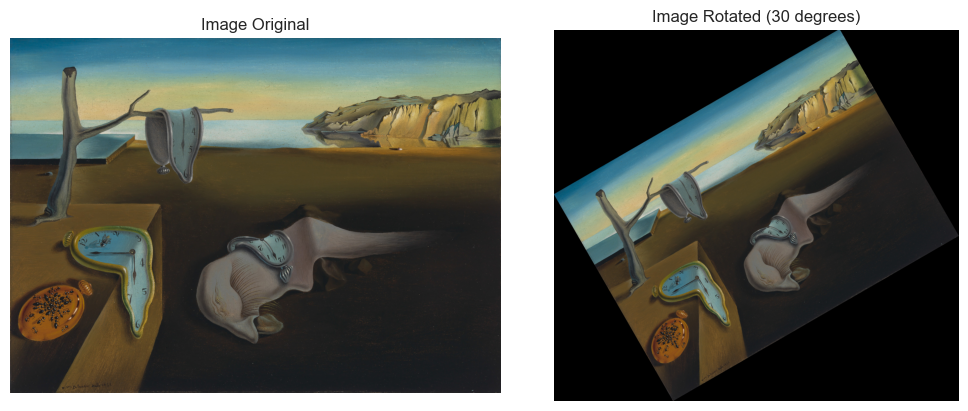

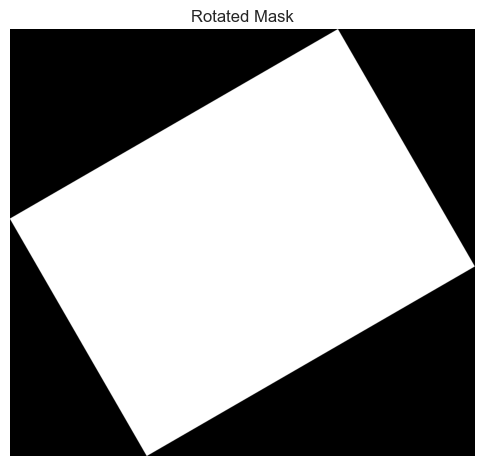

> 1059.41 ms : Mask Erosion
> 301.83 ms : Keypoint 1 @(1440, 1992) Extraction
> 644.51 ms : Keypoint 2 @(2243, 2445) Extraction
>> kp1: 2707
>> kp2: 2729
> 52.06 ms : Keypoint Descriptor Extraction


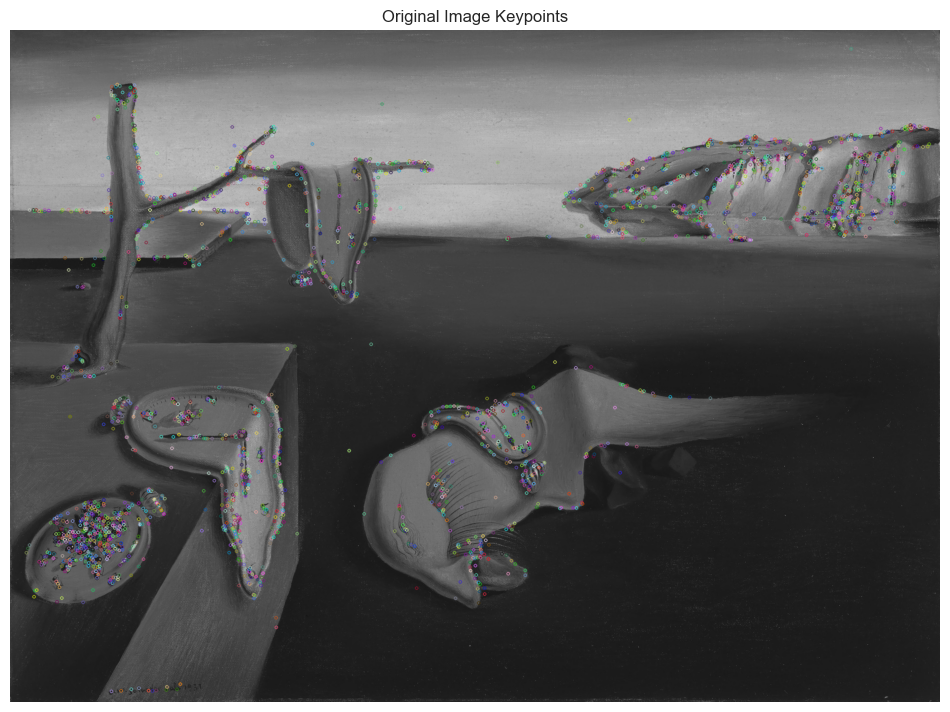

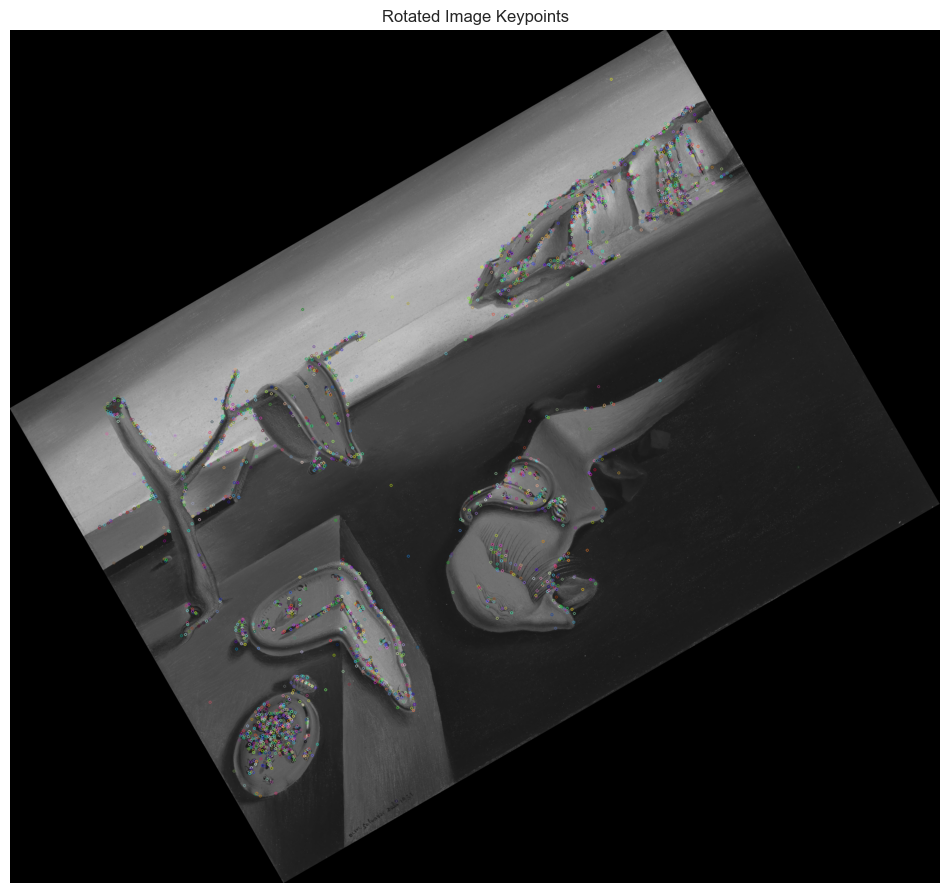

> 1133.30 ms : Keypoint Matching
> 0.27 ms : Ratio Test


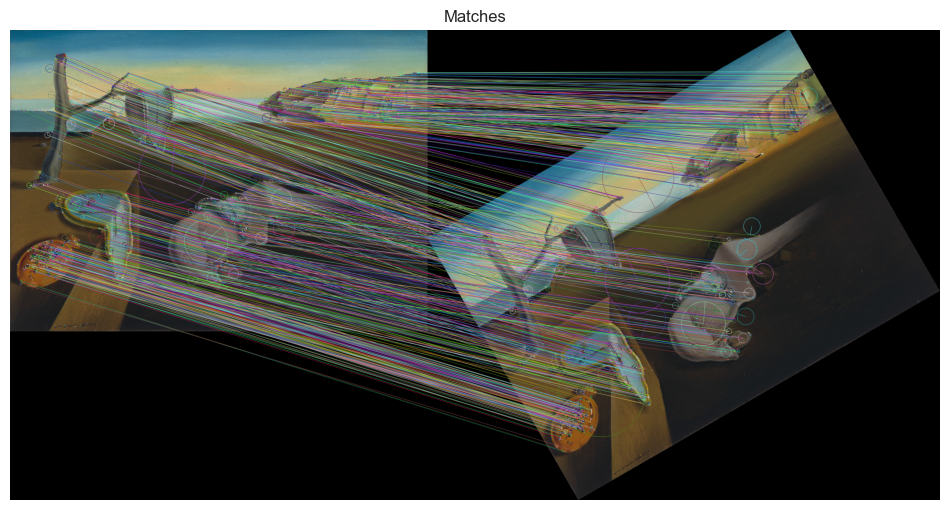

> 839.16 ms : Homography Estimation
> 8.43 ms : Image Warping


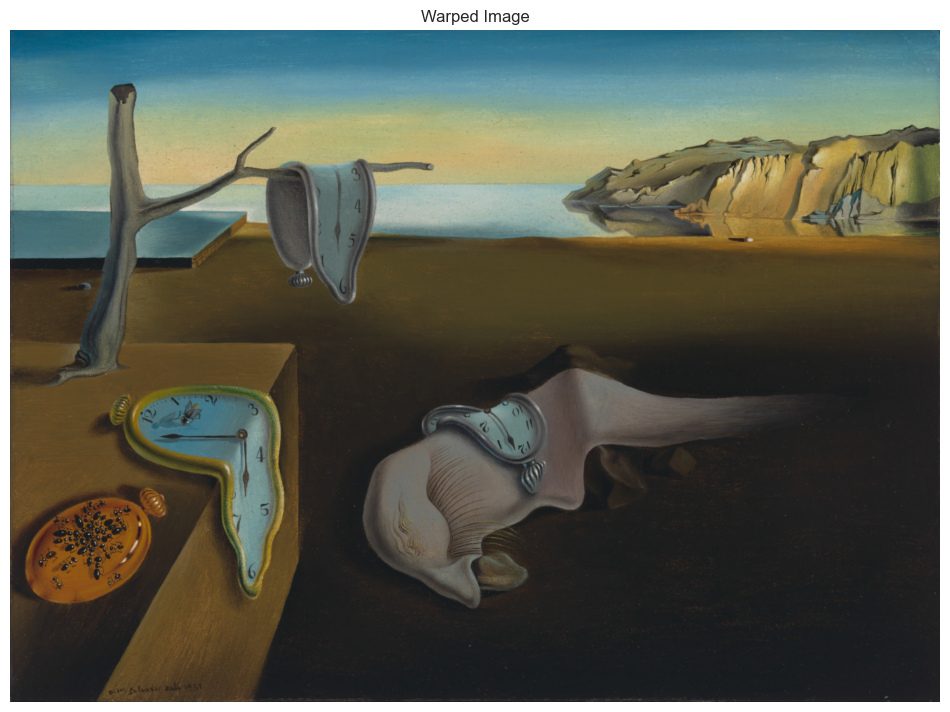

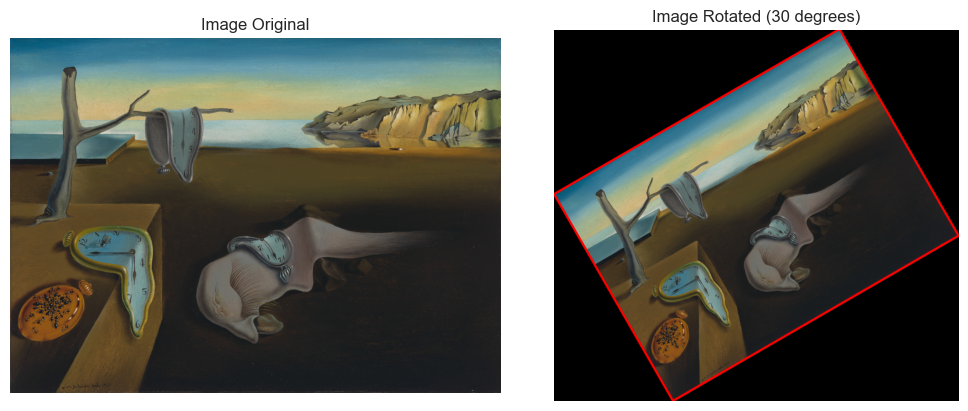

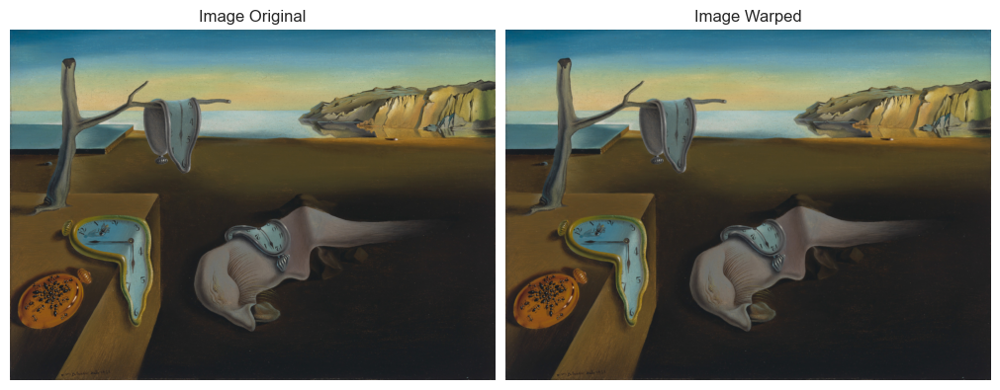

CPU times: total: 7.14 s
Wall time: 6.03 s


In [50]:
%%time
out = align_using_FREAK(img, angle=30, debug=True)

### 90 degrees

> 0.65 ms : Grayscale conversion
> 14.42 ms : Rotation
> 1.06 ms : Grayscale conversion
> 6.17 ms : Mask Creation


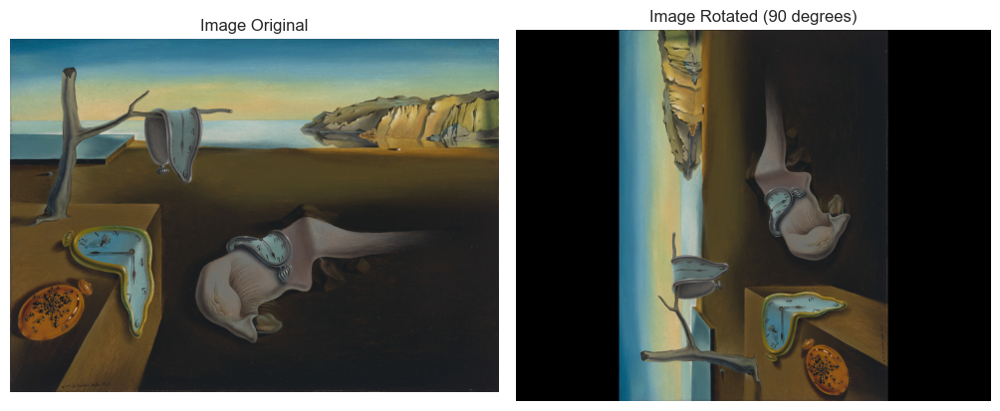

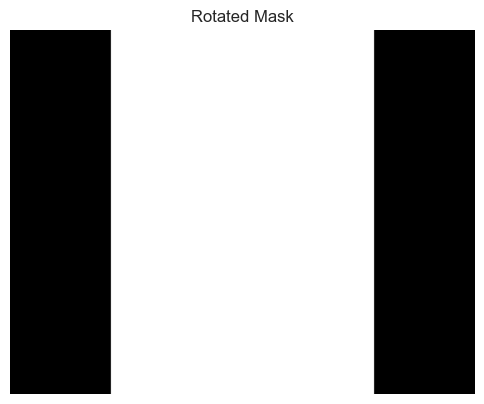

> 1050.75 ms : Mask Erosion
> 313.26 ms : Keypoint 1 @(1440, 1992) Extraction
> 586.05 ms : Keypoint 2 @(1992, 2544) Extraction
>> kp1: 2707
>> kp2: 2668
> 53.15 ms : Keypoint Descriptor Extraction


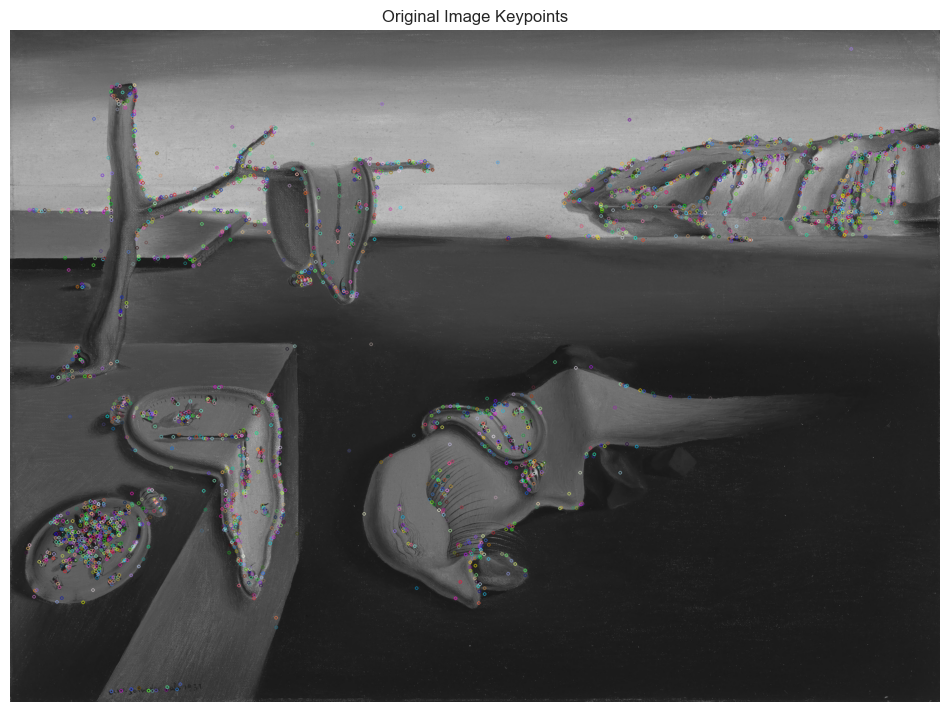

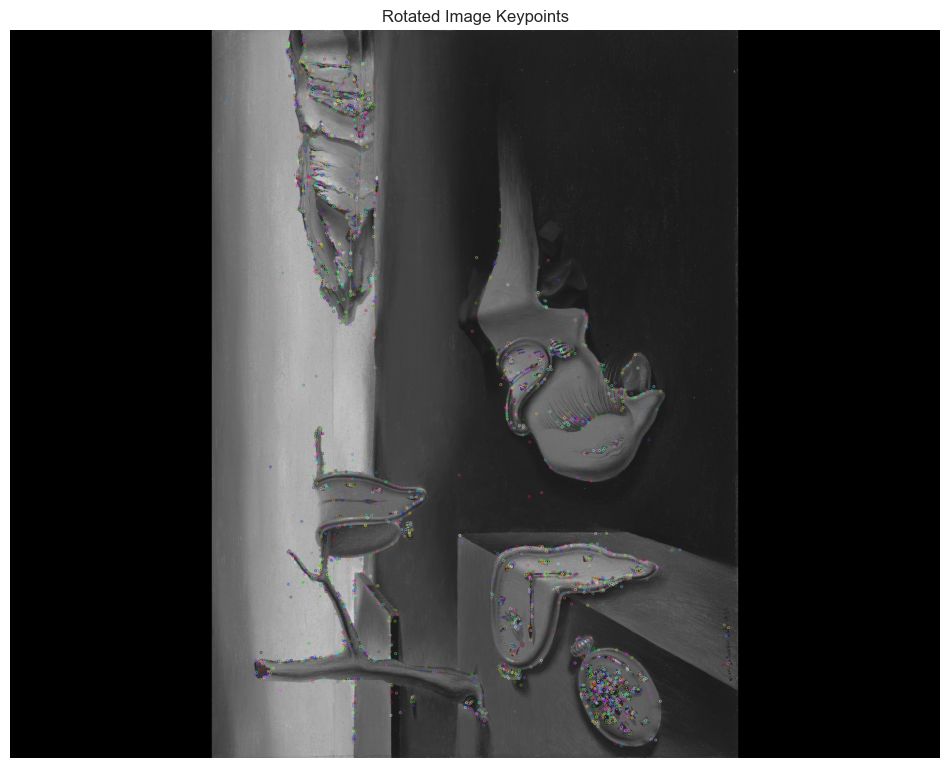

> 1010.36 ms : Keypoint Matching
> 0.45 ms : Ratio Test


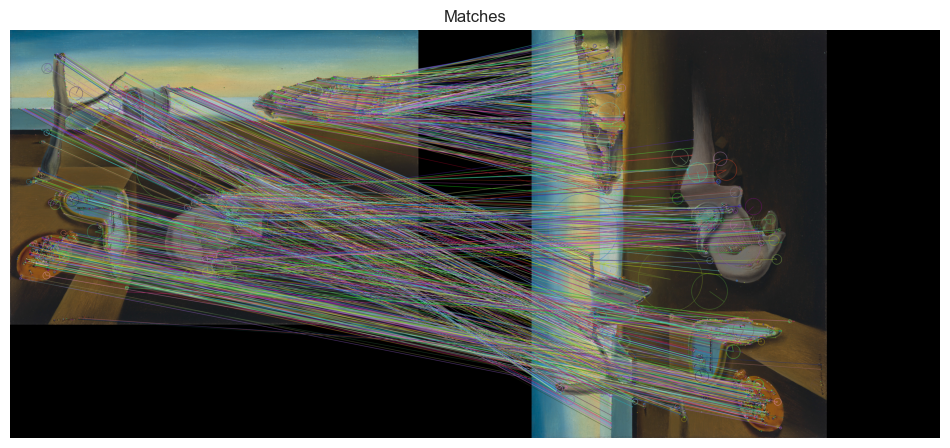

> 803.31 ms : Homography Estimation
> 9.24 ms : Image Warping


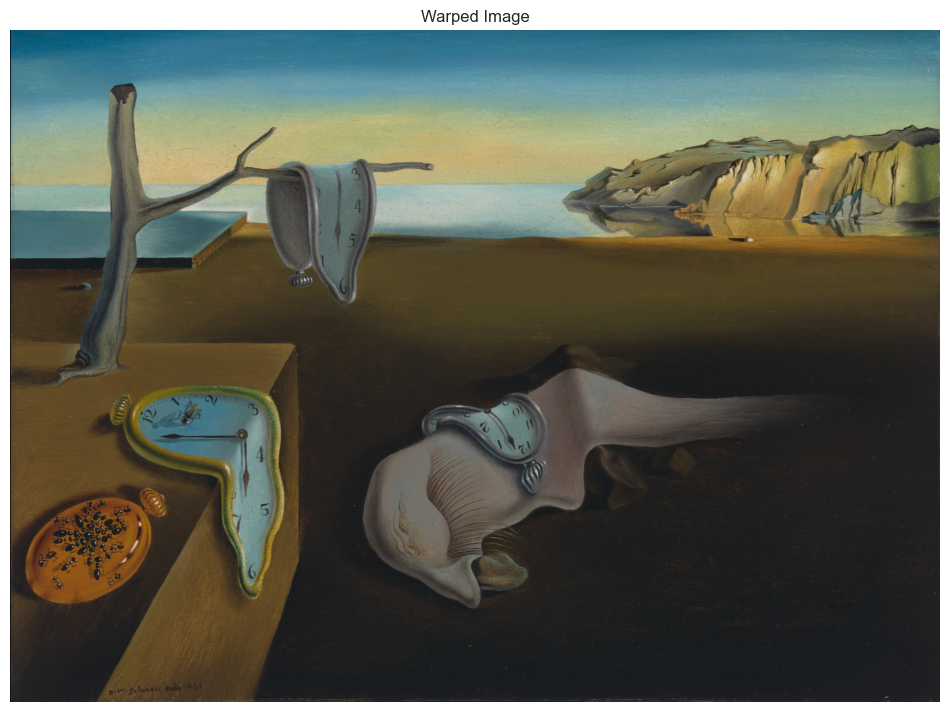

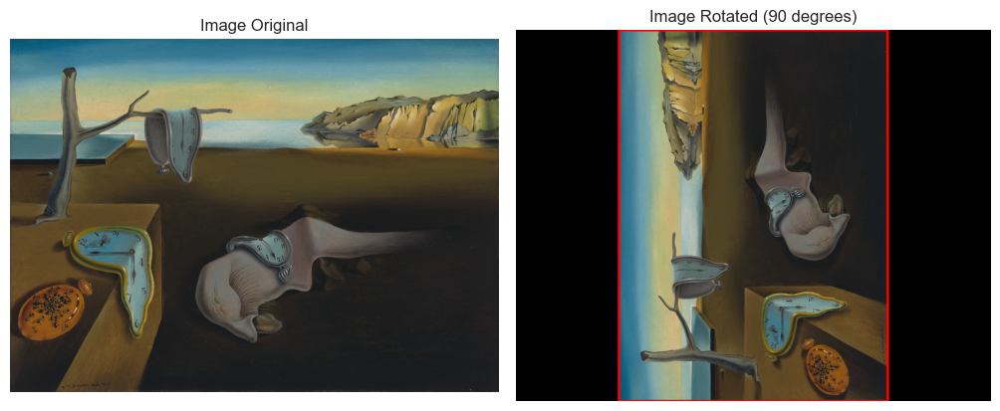

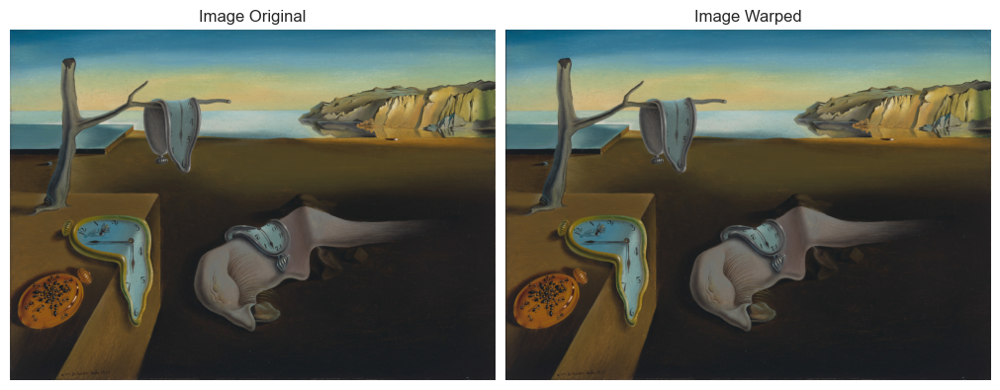

CPU times: total: 7.16 s
Wall time: 5.98 s


In [51]:
%%time
out = align_using_FREAK(img, angle=90, debug=True)

### 165 degrees

> 0.84 ms : Grayscale conversion
> 12.10 ms : Rotation
> 1.40 ms : Grayscale conversion
> 5.95 ms : Mask Creation


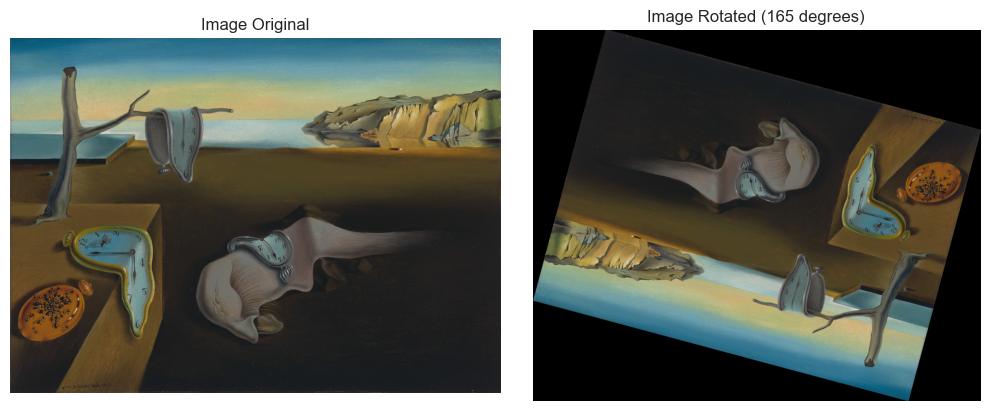

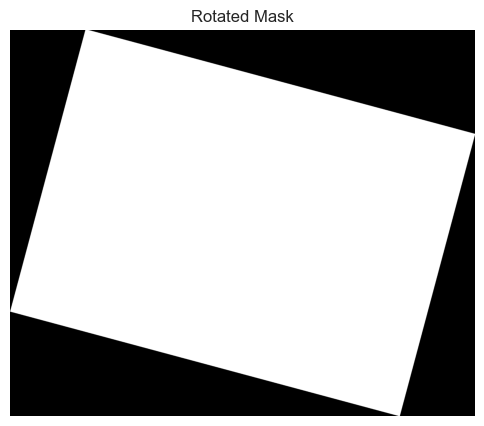

> 983.00 ms : Mask Erosion
> 330.42 ms : Keypoint 1 @(1440, 1992) Extraction
> 529.52 ms : Keypoint 2 @(1906, 2296) Extraction
>> kp1: 2707
>> kp2: 2680
> 51.68 ms : Keypoint Descriptor Extraction


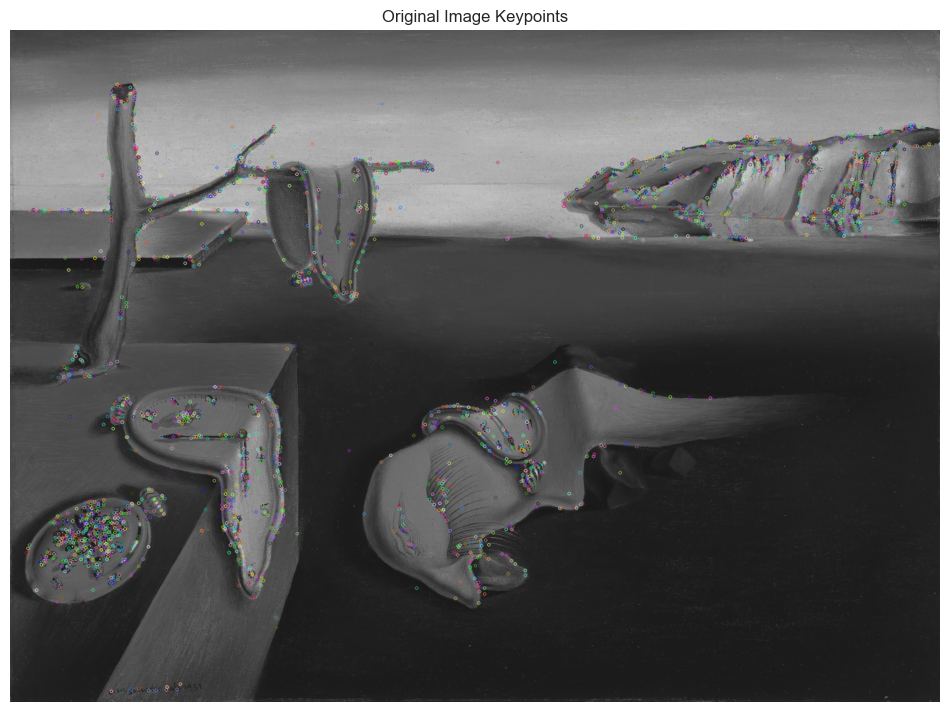

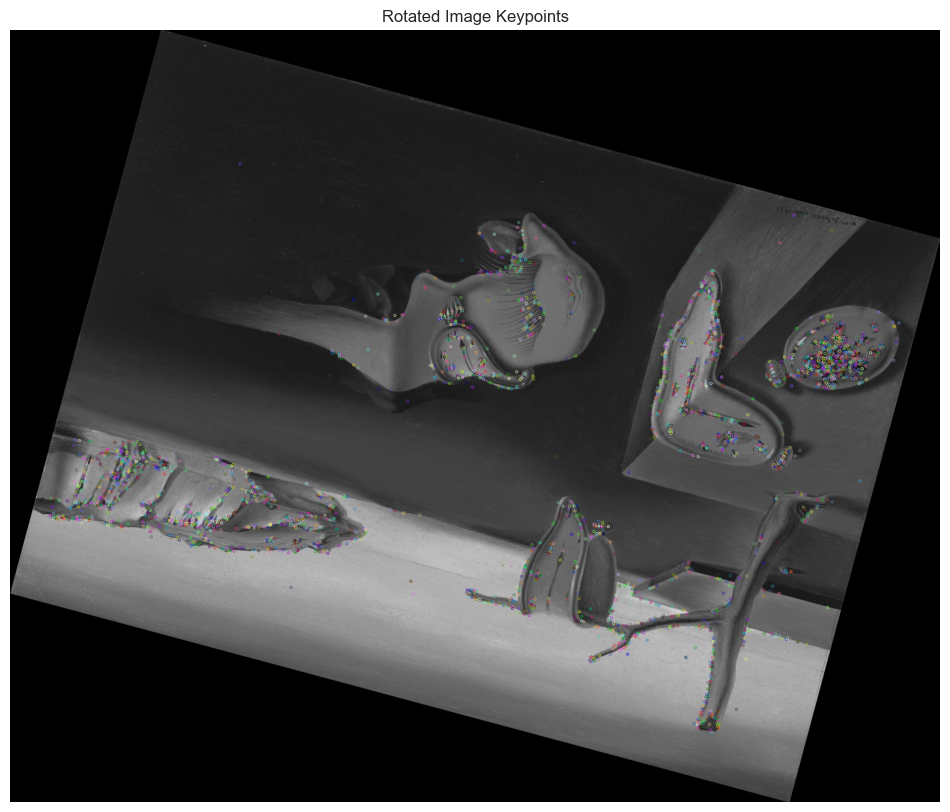

> 978.01 ms : Keypoint Matching
> 0.20 ms : Ratio Test


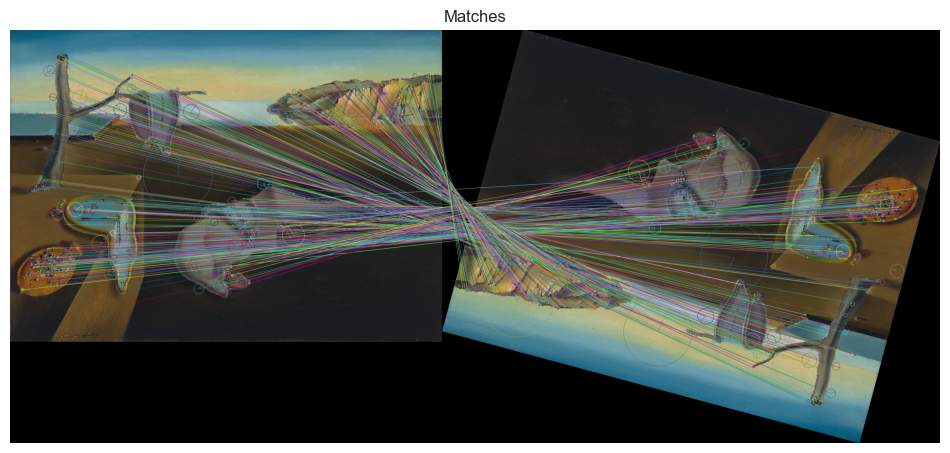

> 716.61 ms : Homography Estimation
> 7.77 ms : Image Warping


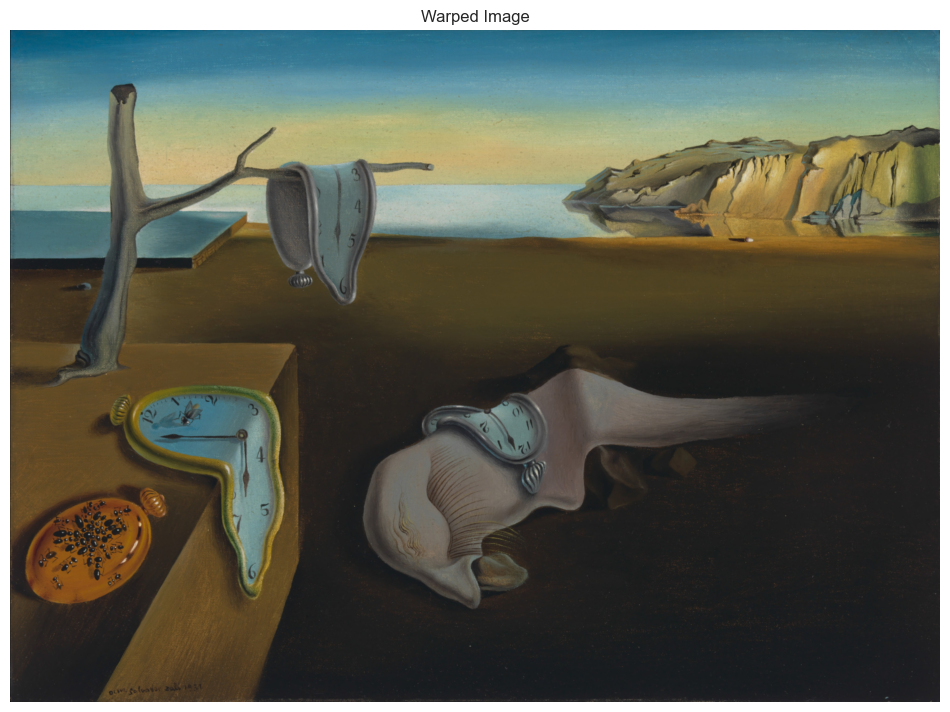

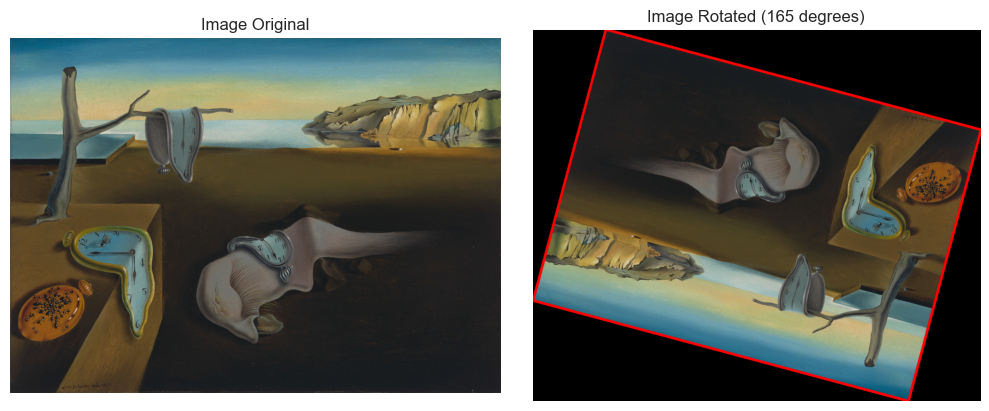

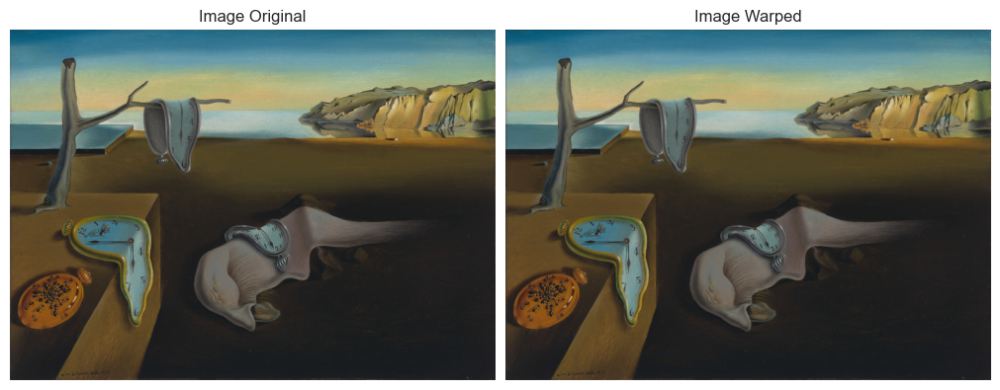

CPU times: total: 6.81 s
Wall time: 5.7 s


In [52]:
%%time
out = align_using_FREAK(img, angle=165, debug=True)